<a href="https://colab.research.google.com/github/Jude-177/CA_683-Assignment/blob/main/US_Accident.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Libraries

In [ ]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
import pandas as pd
from scipy.stats import pearsonr
from sklearn.feature_selection import f_classif, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
import pandas as pd
from sklearn.feature_selection import f_classif, mutual_info_classif
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
import numpy as np
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

## Data Description

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/US_Accidents_March23_sampled_500k.csv")
# df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/US_Accidents_March23_sampled_500k.csv")

In [ ]:
df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-2047758,Source2,2,2019-06-12 10:10:56,2019-06-12 10:55:58,30.641211,-91.153481,NaN,NaN,0.000,...,False,False,False,False,True,False,Day,Day,Day,Day
1,A-4694324,Source1,2,2022-12-03 23:37:14.000000000,2022-12-04 01:56:53.000000000,38.990562,-77.399070,38.990037,-77.398282,0.056,...,False,False,False,False,False,False,Night,Night,Night,Night
2,A-5006183,Source1,2,2022-08-20 13:13:00.000000000,2022-08-20 15:22:45.000000000,34.661189,-120.492822,34.661189,-120.492442,0.022,...,False,False,False,False,True,False,Day,Day,Day,Day
3,A-4237356,Source1,2,2022-02-21 17:43:04,2022-02-21 19:43:23,43.680592,-92.993317,43.680574,-92.972223,1.054,...,False,False,False,False,False,False,Day,Day,Day,Day
4,A-6690583,Source1,2,2020-12-04 01:46:00,2020-12-04 04:13:09,35.395484,-118.985176,35.395476,-118.985995,0.046,...,False,False,False,False,False,False,Night,Night,Night,Night


In [ ]:
(df.Sunrise_Sunset.unique())

array(['Day', 'Night', nan], dtype=object)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 46 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   ID                     500000 non-null  object 
 1   Source                 500000 non-null  object 
 2   Severity               500000 non-null  int64  
 3   Start_Time             500000 non-null  object 
 4   End_Time               500000 non-null  object 
 5   Start_Lat              500000 non-null  float64
 6   Start_Lng              500000 non-null  float64
 7   End_Lat                279623 non-null  float64
 8   End_Lng                279623 non-null  float64
 9   Distance(mi)           500000 non-null  float64
 10  Description            499999 non-null  object 
 11  Street                 499309 non-null  object 
 12  City                   499981 non-null  object 
 13  County                 500000 non-null  object 
 14  State                  500000 non-nu

In [ ]:
# Group data by Category
grouped = df.groupby('Severity').size()/500000 * 100

# Calculate the sum of values for each category
#sum_values = grouped['Value'].sum()
grouped


Severity
1     0.8548
2    79.6284
3    16.9040
4     2.6128
dtype: float64

In [ ]:

# Sample accident data (replace with your actual dataset)
accident_data = df

#   {
#     'Start_Latitude': [40.7128, 34.0522, 39.9526],  # Example latitude values
#     'Start_Longitude': [-74.0060, -118.2437, -75.1652],  # Example longitude values
# }

# Create a scatter mapbox plot
fig = px.scatter_mapbox(accident_data,
                        lat= df.Start_Lat,
                        lon= df.Start_Lng,
                        zoom=3)  # Adjust zoom level as needed

# Customize the map layout
fig.update_layout(mapbox_style='open-street-map',  # Choose map style
                  margin={'r': 0, 't': 0, 'l': 0, 'b': 0})  # Adjust margins

# Show the plot
fig.show()


## Dealing with Missing Values

In [ ]:
df.isnull().values.any() # check if there is missing data

True

In [ ]:
round(df.isnull().sum()/500000*100, 1) # by percentages

ID                        0.0
Source                    0.0
Severity                  0.0
Start_Time                0.0
End_Time                  0.0
Start_Lat                 0.0
Start_Lng                 0.0
End_Lat                  44.1
End_Lng                  44.1
Distance(mi)              0.0
Description               0.0
Street                    0.1
City                      0.0
County                    0.0
State                     0.0
Zipcode                   0.0
Country                   0.0
Timezone                  0.1
Airport_Code              0.3
Weather_Timestamp         1.5
Temperature(F)            2.1
Wind_Chill(F)            25.8
Humidity(%)               2.2
Pressure(in)              1.8
Visibility(mi)            2.3
Wind_Direction            2.2
Wind_Speed(mph)           7.4
Precipitation(in)        28.5
Weather_Condition         2.2
Amenity                   0.0
Bump                      0.0
Crossing                  0.0
Give_Way                  0.0
Junction  

Dropping all rows of features, where missingness is less than 10%.

In [ ]:
df_10 = df.dropna(subset = ['Street', 'Timezone', 'Airport_Code', 'Weather_Timestamp',
                             'Temperature(F)',
                             'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
                             'Wind_Speed(mph)',
                             'Weather_Condition', 'Sunrise_Sunset', 'Civil_Twilight',
                             'Nautical_Twilight', 'Astronomical_Twilight', 'Description'])

df_10.shape

(456181, 46)

In [ ]:
df_10.isnull().sum()

ID                            0
Source                        0
Severity                      0
Start_Time                    0
End_Time                      0
Start_Lat                     0
Start_Lng                     0
End_Lat                  194607
End_Lng                  194607
Distance(mi)                  0
Description                   0
Street                        0
City                          0
County                        0
State                         0
Zipcode                       0
Country                       0
Timezone                      0
Airport_Code                  0
Weather_Timestamp             0
Temperature(F)                0
Wind_Chill(F)             89906
Humidity(%)                   0
Pressure(in)                  0
Visibility(mi)                0
Wind_Direction                0
Wind_Speed(mph)               0
Precipitation(in)        109387
Weather_Condition             0
Amenity                       0
Bump                          0
Crossing

After doing this, we have lost 8.76% of the data. We are now left with 4 columns with missing values to work on.

In [ ]:
# imputing wind_chill missing values with formula.
df_10['Wind_Chill(F)'] = df_10['Wind_Chill(F)'].fillna(35.74 + 0.6215*df_10['Temperature(F)'] -
                                                       35.75*(df_10['Wind_Speed(mph)']**(0.16))
                                                       + 0.4275*((df_10['Temperature(F)'] * (df_10['Wind_Speed(mph)']**(0.16)))))

<ipython-input-13-9ed8bc53307a>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df_10.isnull().sum()

ID                            0
Source                        0
Severity                      0
Start_Time                    0
End_Time                      0
Start_Lat                     0
Start_Lng                     0
End_Lat                  194607
End_Lng                  194607
Distance(mi)                  0
Description                   0
Street                        0
City                          0
County                        0
State                         0
Zipcode                       0
Country                       0
Timezone                      0
Airport_Code                  0
Weather_Timestamp             0
Temperature(F)                0
Wind_Chill(F)                 0
Humidity(%)                   0
Pressure(in)                  0
Visibility(mi)                0
Wind_Direction                0
Wind_Speed(mph)               0
Precipitation(in)        109387
Weather_Condition             0
Amenity                       0
Bump                          0
Crossing

In [ ]:
df_10['Precipitation(in)'].describe()

count    346794.000000
mean          0.007649
std           0.073748
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          10.090000
Name: Precipitation(in), dtype: float64

In [ ]:
# count the number of values above a threshold
above_threshold_count = (df_10['Precipitation(in)'] > 1 ).sum()
above_threshold_count

113

In [ ]:
count = df_10.loc[df_10['Severity'] == 4, 'Precipitation(in)'].gt(1).sum()
count

2

We want to replace missing values with the mean of Precipitation column but only using values greater than or equal to 0 and less than or equal to 1.

In [ ]:
# # calculating the mean considering only values within the specified range
# mean_within_range = df_10.loc[(df_10['Precipitation(in)'].ge(0)) & (df_10['Precipitation(in)'].le(1)),
#                            'Precipitation(in)'].mean()

# print(mean_within_range)

# # replacing the missing values with the mean within the specified range
# df_10wcp = df_10['Precipitation(in)'].fillna(mean_within_range)
# df_10wcp.shape

Final decision is to replace with mean of Precipitation

In [ ]:
# calculating the mean of the column
mean_value = df_10['Precipitation(in)'].mean()
print(mean_value)

# filling missing values with the mean
df_10['Precipitation(in)'].fillna(mean_value, inplace = True)


0.007649151946112101


<ipython-input-19-83405d2c1d9f>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
print(df_10.shape)

df_10.isnull().sum()

(456181, 46)


ID                            0
Source                        0
Severity                      0
Start_Time                    0
End_Time                      0
Start_Lat                     0
Start_Lng                     0
End_Lat                  194607
End_Lng                  194607
Distance(mi)                  0
Description                   0
Street                        0
City                          0
County                        0
State                         0
Zipcode                       0
Country                       0
Timezone                      0
Airport_Code                  0
Weather_Timestamp             0
Temperature(F)                0
Wind_Chill(F)                 0
Humidity(%)                   0
Pressure(in)                  0
Visibility(mi)                0
Wind_Direction                0
Wind_Speed(mph)               0
Precipitation(in)             0
Weather_Condition             0
Amenity                       0
Bump                          0
Crossing

We have dealt with wind_chill, precipitation, we are now left with end latitude and end longitude.

We want to drop these columns, why?

* First of all, almost 50% of it is missing.
* Secondly, end_latitude has 100% correlation with start_latitude, same for longitude.

In [ ]:
# dropping these two columns; end_lat and end_lng

columns_to_drop = ['End_Lat', 'End_Lng']

df_10.drop(columns = columns_to_drop, inplace = True)

<ipython-input-21-7fa44bc7c6e7>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
print(df_10.shape)

df_10.isnull().sum()

(456181, 44)


ID                       0
Source                   0
Severity                 0
Start_Time               0
End_Time                 0
Start_Lat                0
Start_Lng                0
Distance(mi)             0
Description              0
Street                   0
City                     0
County                   0
State                    0
Zipcode                  0
Country                  0
Timezone                 0
Airport_Code             0
Weather_Timestamp        0
Temperature(F)           0
Wind_Chill(F)            0
Humidity(%)              0
Pressure(in)             0
Visibility(mi)           0
Wind_Direction           0
Wind_Speed(mph)          0
Precipitation(in)        0
Weather_Condition        0
Amenity                  0
Bump                     0
Crossing                 0
Give_Way                 0
Junction                 0
No_Exit                  0
Railway                  0
Roundabout               0
Station                  0
Stop                     0
T

In [ ]:
data = df_10

In [ ]:
data.Weather_Condition.unique()

array(['Fair', 'Wintry Mix', 'Light Rain', 'Cloudy', 'Mostly Cloudy',
       'Partly Cloudy', 'Clear', 'Scattered Clouds', 'Fog', 'Overcast',
       'Light Snow', 'T-Storm', 'Thunderstorms and Rain', 'Thunder',
       'Light Rain with Thunder', 'Rain', 'Showers in the Vicinity',
       'Mostly Cloudy / Windy', 'Heavy Rain', 'Cloudy / Windy',
       'Light Drizzle', 'Heavy T-Storm', 'Light Rain / Windy', 'Smoke',
       'Blowing Dust / Windy', 'Haze', 'N/A Precipitation',
       'Thunder in the Vicinity', 'Snow', 'Heavy Thunderstorms and Rain',
       'Light Freezing Drizzle', 'Fair / Windy', 'Patches of Fog',
       'Light Snow / Windy', 'Blowing Snow / Windy', 'Thunderstorm',
       'Drizzle', 'T-Storm / Windy', 'Partly Cloudy / Windy',
       'Shallow Fog', 'Heavy Rain / Windy', 'Heavy Snow / Windy', 'Mist',
       'Light Thunderstorms and Rain', 'Rain / Windy',
       'Light Freezing Rain', 'Heavy Snow', 'Light Ice Pellets',
       'Heavy T-Storm / Windy', 'Heavy Drizzle', 'Sleet',


In [ ]:
grouped = data.groupby('Wind_Direction')['Wind_Speed(mph)'].mean()
grouped

Wind_Direction
CALM         0.000000
E            8.545932
ENE          8.538191
ESE          8.459661
East         8.270046
N            8.930212
NE           8.361092
NNE          8.495956
NNW          9.537589
NW          10.004139
North        9.076681
S            9.298875
SE           8.532122
SSE          8.984595
SSW          9.138477
SW           9.057492
South        9.371603
VAR          4.776603
Variable     4.804956
W            9.664758
WNW         10.094270
WSW          9.116943
West         9.846147
Name: Wind_Speed(mph), dtype: float64

## Dropping Columns Not Important

In [ ]:
new_data = data.drop(columns= ["Source", "Street", "Description", "Country", "County", "State", "Airport_Code", "Timezone", "ID", "Zipcode", "City", "Wind_Direction"]) # 12 columns dropped

In [ ]:
new_data.shape

(456181, 32)

## Encoding Categorical Variables

In [ ]:
new_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 456181 entries, 0 to 499999
Data columns (total 32 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Severity               456181 non-null  int64  
 1   Start_Time             456181 non-null  object 
 2   End_Time               456181 non-null  object 
 3   Start_Lat              456181 non-null  float64
 4   Start_Lng              456181 non-null  float64
 5   Distance(mi)           456181 non-null  float64
 6   Weather_Timestamp      456181 non-null  object 
 7   Temperature(F)         456181 non-null  float64
 8   Wind_Chill(F)          456181 non-null  float64
 9   Humidity(%)            456181 non-null  float64
 10  Pressure(in)           456181 non-null  float64
 11  Visibility(mi)         456181 non-null  float64
 12  Wind_Speed(mph)        456181 non-null  float64
 13  Precipitation(in)      456181 non-null  float64
 14  Weather_Condition      456181 non-null  o

In [ ]:
# Create a LabelEncoder object
label_encoder = LabelEncoder()

# Fit the LabelEncoder to the column and transform the column values
new_data['Weather_Condition'] = label_encoder.fit_transform(new_data['Weather_Condition'])

In [ ]:
new_data.Weather_Condition

0          11
1          11
2          11
3         104
4          11
         ... 
499995     42
499996     68
499997     11
499998     11
499999     11
Name: Weather_Condition, Length: 456181, dtype: int64

In [ ]:
binary_columns = ["Amenity", "Bump", "Crossing", "Give_Way", "Junction", "No_Exit", "Railway", "Roundabout", "Station", "Stop", "Traffic_Calming", "Traffic_Signal", "Turning_Loop"]
new_data[binary_columns] = new_data[binary_columns].astype(int)

In [ ]:
new_data.Bump

0         0
1         0
2         0
3         0
4         0
         ..
499995    0
499996    0
499997    0
499998    0
499999    0
Name: Bump, Length: 456181, dtype: int64

In [ ]:
columns_with_day_night = ["Sunrise_Sunset","Astronomical_Twilight", "Civil_Twilight","Nautical_Twilight"]

# Define a mapping dictionary for replacement
day_night_mapping = {'Day': 0, 'Night': 1}

# Replace 'day' and 'night' with 0 and 1 respectively
new_data[columns_with_day_night] = new_data[columns_with_day_night].replace(day_night_mapping)


In [ ]:
new_data.shape

(456181, 32)

In [ ]:
new_data.Sunrise_Sunset

0         0
1         1
2         0
3         0
4         1
         ..
499995    1
499996    0
499997    1
499998    0
499999    1
Name: Sunrise_Sunset, Length: 456181, dtype: int64

In [ ]:
new_data.drop(columns = ["Start_Time", "End_Time", "Weather_Timestamp"], inplace = True)

In [ ]:
new_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 456181 entries, 0 to 499999
Data columns (total 29 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Severity               456181 non-null  int64  
 1   Start_Lat              456181 non-null  float64
 2   Start_Lng              456181 non-null  float64
 3   Distance(mi)           456181 non-null  float64
 4   Temperature(F)         456181 non-null  float64
 5   Wind_Chill(F)          456181 non-null  float64
 6   Humidity(%)            456181 non-null  float64
 7   Pressure(in)           456181 non-null  float64
 8   Visibility(mi)         456181 non-null  float64
 9   Wind_Speed(mph)        456181 non-null  float64
 10  Precipitation(in)      456181 non-null  float64
 11  Weather_Condition      456181 non-null  int64  
 12  Amenity                456181 non-null  int64  
 13  Bump                   456181 non-null  int64  
 14  Crossing               456181 non-null  i

## Variables

* Output Variable: Severity

* Continous Variables: Start_Lat, Start_Lng, Distance(mi), Temperature(F), Wind_Chill(F), Humidity(%), Pressure(in), Visibility(mi), Wind_Speed(mph),      Precipitation(in)

* Categorical Variables: Weather_Condition, Amenity, "Bump", "Crossing", "Give_Way", "Junction", "No_Exit", "Railway", "Roundabout", "Station", "Stop", "Traffic_Calming", "Traffic_Signal", "Turning_Loop", "Sunrise_Sunset","Astronomical_Twilight", "Civil_Twilight", "Nautical_Twilight".

In [ ]:
# Group data by Category
grouped = new_data.groupby('Severity').size()#/456181 * 100

# Calculate the sum of values for each category
#sum_values = grouped['Value'].sum()
grouped

Severity
1      4113
2    366655
3     73959
4     11454
dtype: int64

## Working on the Categorical Variables

Chi-square test of independence

* Assesses whether therei s a significant association between two categorical variables.

* For binary variables, we perform a chi-square test to determine if there is a significant relationship between each binary variable and the target variable.

In [ ]:
from scipy.stats import chi2_contingency


# target variable we want to test against
target_variable = 'Severity'

# Create a list of variables to test
variables_to_test = ['Weather_Condition', 'Amenity', "Bump", "Crossing", "Give_Way",
                     "Junction", "No_Exit", "Railway", "Roundabout", "Station", "Stop",
                     "Traffic_Calming", "Traffic_Signal", "Turning_Loop", "Sunrise_Sunset",
                     "Astronomical_Twilight", "Civil_Twilight", "Nautical_Twilight",

                    ]
#variables_to_test.remove(target_variable)

# Perform chi-square test for each pair of variables
results = {}
for variable in variables_to_test:
    crosstab = pd.crosstab(df[target_variable], df[variable])
    chi2, p_value, _, _ = chi2_contingency(crosstab)
    results[variable] = {'chi2': chi2, 'p_value': p_value}

# Print results
for variable, result in results.items():
    print(f"Chi-square test results for {variable}:")
    print(f"Chi-square value: {result['chi2']}")
    print(f"P-value: {result['p_value']}")
    if result['p_value'] < 0.05:
        print("The association is statistically significant.")
    else:
        print("The association is not statistically significant.")
    print()


Chi-square test results for Weather_Condition:
Chi-square value: 23979.531083879607
P-value: 0.0
The association is statistically significant.

Chi-square test results for Amenity:
Chi-square value: 722.7724141015349
P-value: 2.4210564667503027e-156
The association is statistically significant.

Chi-square test results for Bump:
Chi-square value: 8.286362640911964
P-value: 0.04044973955736118
The association is statistically significant.

Chi-square test results for Crossing:
Chi-square value: 7177.24526231743
P-value: 0.0
The association is statistically significant.

Chi-square test results for Give_Way:
Chi-square value: 45.61625931149009
P-value: 6.843537778849812e-10
The association is statistically significant.

Chi-square test results for Junction:
Chi-square value: 1472.4312765589193
P-value: 0.0
The association is statistically significant.

Chi-square test results for No_Exit:
Chi-square value: 72.6202144757698
P-value: 1.1723332171965837e-15
The association is statistically 

In [ ]:
new_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 456181 entries, 0 to 499999
Data columns (total 29 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Severity               456181 non-null  int64  
 1   Start_Lat              456181 non-null  float64
 2   Start_Lng              456181 non-null  float64
 3   Distance(mi)           456181 non-null  float64
 4   Temperature(F)         456181 non-null  float64
 5   Wind_Chill(F)          456181 non-null  float64
 6   Humidity(%)            456181 non-null  float64
 7   Pressure(in)           456181 non-null  float64
 8   Visibility(mi)         456181 non-null  float64
 9   Wind_Speed(mph)        456181 non-null  float64
 10  Precipitation(in)      456181 non-null  float64
 11  Weather_Condition      456181 non-null  int64  
 12  Amenity                456181 non-null  int64  
 13  Bump                   456181 non-null  int64  
 14  Crossing               456181 non-null  i

## Working on Continous Variables

### Correlation

Index(['Start_Lat', 'Start_Lng', 'Distance(mi)', 'Temperature(F)',
       'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Severity'],
      dtype='object')


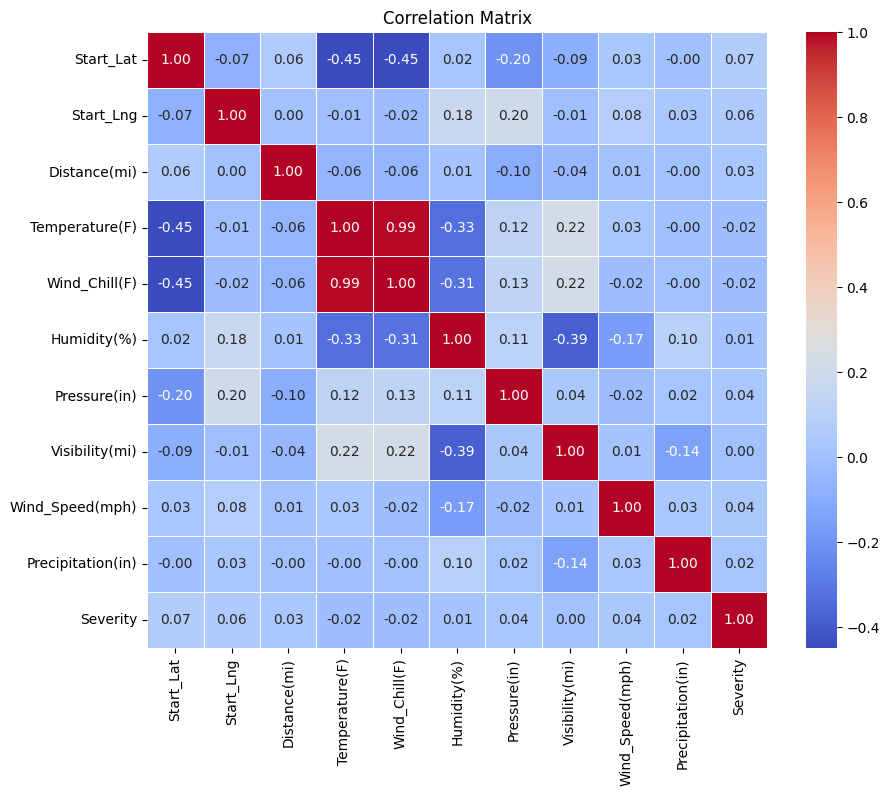

In [ ]:
# filter columns with float data types
float_columns = new_data.select_dtypes(include = ['float64'])
float_columns['Severity'] = new_data.Severity
print(float_columns.columns)

# calculate correlation matrix
correlation_matrix = float_columns.corr()

correlation_matrix
# visualization
plt.figure(figsize = (10,8))
sns.heatmap(correlation_matrix, annot = True, cmap = 'coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix')
plt.show()

In [ ]:
# dropping categorical variables which were insignificant
new_data.drop(columns = ["Roundabout", "Turning_Loop"], inplace = True)

In [ ]:
new_data.shape

(456181, 27)

In [ ]:
# dropping highly correlated continous variables
new_data.drop(columns = ['Temperature(F)'], inplace = True)

In [ ]:
new_data.shape

(456181, 26)

## Model Training

* XGBoost is a gradient boosting algorithm designed to be highly efficient.

* it works by combining a number of weak learners to form a strong learner.

* It works by training a number of decision trees. Each tree is trained on a subset of the data, and the predictions from each tree are combined to form the final prediction.

In [ ]:
import xgboost as xgb
from sklearn.model_selection import train_test_split


In [ ]:
y = new_data.Severity
y = y-1
# Group data by Category
grouped = y.groupby(y).size()/len(y) * 100
print(grouped)

Severity
0     0.901616
1    80.374895
2    16.212644
3     2.510845
Name: Severity, dtype: float64


In [ ]:
# splitting the data into train and test sets with stratified sampling to ensure
# that the class distribution is maintained in both sets.

X = new_data.drop(columns = ['Severity'])
print('Before Splits')
print(y.shape, X.shape)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42, stratify = y)
print('After Splits')
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)


Before Splits
(456181,) (456181, 25)
After Splits
(364944, 25) (91237, 25) (364944,) (91237,)


In [ ]:

groupedyt = y_test.groupby(y_test).size()
groupedyt

Severity
0      822
1    73332
2    14792
3     2291
Name: Severity, dtype: int64

### XGBoost with cross validation, class weights, confusion matrix and classification report.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import cross_val_predict, StratifiedKFold
from sklearn.metrics import confusion_matrix, classification_report
import xgboost as xgb

In [ ]:
# Define the number of folds for cross-validation
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

In [ ]:
from sklearn.utils.class_weight import compute_class_weight

# Computing class weights
class_weights = compute_class_weight('balanced', classes = np.unique(y_train), y = y_train)

# Convert class weights to a dictionary format
class_weight_dict = dict(enumerate(class_weights))
print(class_weight_dict)

{0: 27.7228805834093, 1: 0.311042775370496, 2: 1.5420082140382307, 3: 9.957000982211067}


In [ ]:
model_xgb_k = xgb.XGBClassifier(objective='multi:softmax', num_class=4, scale_pos_weight=class_weight_dict)

In [ ]:
# Perform cross-validation and get predicted labels
y_pred_xgb = cross_val_predict(model_xgb_k, X, y, cv=skf)

# Compute confusion matrix
conf_matrix_xgb = confusion_matrix(y, y_pred_xgb)
print("Confusion Matrix XGB:")
print(conf_matrix_xgb)

# Generate classification report
class_report_xgb = classification_report(y, y_pred_xgb)
print("Classification Report XGB:")
print(class_report_xgb)

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning:

[14:32:21] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning:

[14:32:57] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning:

[14:33:20] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning:

[14:33:44] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning:

[14:34:08] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.




Confusion Matrix XGB:
[[   111   3726    276      0]
 [    99 351744  14538    274]
 [    10  40251  33519    179]
 [     0  10039    829    586]]
Classification Report XGB:
              precision    recall  f1-score   support

           0       0.50      0.03      0.05      4113
           1       0.87      0.96      0.91    366655
           2       0.68      0.45      0.54     73959
           3       0.56      0.05      0.09     11454

    accuracy                           0.85    456181
   macro avg       0.65      0.37      0.40    456181
weighted avg       0.83      0.85      0.82    456181



### Feedforward Neural Network

### FNN with class weights and cross-validation

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, classification_report

# initializing lists to store the metrics for each fold
accuracies = []
precisions = []
recalls = []
f1_scores = []
reports = []

# performing cross-validation
for fold, (train_index, val_index) in enumerate(skf.split(X, y), 1):
    print(f"Fold {fold}/{n_splits}")

    # splitting the data into training and validation sets for the current fold
    X_train_fold, X_val_fold = X.iloc[train_index], X.iloc[val_index]
    y_train_fold, y_val_fold = y.iloc[train_index], y.iloc[val_index]

    # creating a new model for each fold
    model = create_model()

    # training the model
    print("Training...")
    history = model.fit(X_train_fold, y_train_fold, epochs=5, batch_size=16, validation_data=(X_val_fold, y_val_fold), verbose=1,
                        class_weight = class_weight_dict)

    # evaluating the model on the validation set
    print("Evaluating...")
    y_pred_fold = model.predict(X_val_fold)
    y_pred_fold = np.argmax(y_pred_fold, axis=1)

    # calculating metrics for the current fold
    accuracy = np.mean(y_pred_fold == y_val_fold)
    precision = precision_score(y_val_fold, y_pred_fold, average='weighted')
    recall = recall_score(y_val_fold, y_pred_fold, average='weighted')
    f1 = f1_score(y_val_fold, y_pred_fold, average='weighted')
    report = classification_report(y_val_fold, y_pred_fold)

    # storing the metrics for the current fold
    accuracies.append(accuracy)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)
    reports.append(report)

    print(f"Fold {fold} - Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}")
    print("Classification Report:")
    print(report)
    print("------------------------")

# calculating the mean and standard deviation of the metrics across all folds
mean_accuracy = np.mean(accuracies)
std_accuracy = np.std(accuracies)
mean_precision = np.mean(precisions)
std_precision = np.std(precisions)
mean_recall = np.mean(recalls)
std_recall = np.std(recalls)
mean_f1 = np.mean(f1_scores)
std_f1 = np.std(f1_scores)

print("Cross-validation results:")
print(f"Accuracy: {mean_accuracy:.4f} ± {std_accuracy:.4f}")
print(f"Precision: {mean_precision:.4f} ± {std_precision:.4f}")
print(f"Recall: {mean_recall:.4f} ± {std_recall:.4f}")
print(f"F1 Score: {mean_f1:.4f} ± {std_f1:.4f}")

# printing the classification report for the overall cross-validation
print("Overall Classification Report:")
overall_report = classification_report(y, np.concatenate([model.predict(X_val_fold).argmax(axis=1) for _, val_index in skf.split(X, y)]))
print(overall_report)

Fold 1/5
Training...
Epoch 1/5
22809/22809 [==============================] - 83s 4ms/step - loss: 1.3071 - accuracy: 0.1866 - val_loss: 1.4086 - val_accuracy: 0.1084
Epoch 2/5
22809/22809 [==============================] - 53s 2ms/step - loss: 1.1594 - accuracy: 0.2428 - val_loss: 1.3286 - val_accuracy: 0.2086
Epoch 3/5
22809/22809 [==============================] - 50s 2ms/step - loss: 1.0982 - accuracy: 0.2713 - val_loss: 1.1962 - val_accuracy: 0.3226
Epoch 4/5
22809/22809 [==============================] - 52s 2ms/step - loss: 1.0716 - accuracy: 0.2924 - val_loss: 1.2311 - val_accuracy: 0.2989
Epoch 5/5
22809/22809 [==============================] - 53s 2ms/step - loss: 1.0528 - accuracy: 0.2935 - val_loss: 1.1356 - val_accuracy: 0.3891
Evaluating...
2852/2852 [==============================] - 4s 1ms/step
Fold 1 - Accuracy: 0.3891, Precision: 0.7758, Recall: 0.3891, F1 Score: 0.4699
Classification Report:
              precision    recall  f1-score   support

           0       0.

ValueError: Found input variables with inconsistent numbers of samples: [456181, 456180]

In [ ]:
# evaluating the model
y_pred_fnn_k = model.predict(X_test)
# Select the class with the highest probability for each sample
y_pred_fnn_prob_k = np.argmax(y_pred_fnn_k, axis=1)
print(y_pred_fnn_prob_k)

# getting the confusion matrix
conf_matrix_fnn_k = confusion_matrix(y_test, y_pred_fnn_prob_k)
print('Confusion Matrix (FNN):')
print(conf_matrix_fnn_k)

2852/2852 [==============================] - 4s 1ms/step
[3 3 0 ... 1 1 3]
Confusion Matrix (FNN):
[[  601   101   102    18]
 [13621 32291  9025 18395]
 [ 3732  2867  6192  2001]
 [   95   590    62  1544]]


### Logistic Regression with cross validation, class weights, evaluation metrics

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_predict, cross_val_score, train_test_split

In [ ]:
model_lr = LogisticRegression(solver = "liblinear", max_iter = 1000, class_weight = class_weight_dict)

In [ ]:
# Perform cross-validation and get predicted labels
y_pred_lr = cross_val_predict(model_lr, X, y, cv=5)



In [ ]:
# Compute cross-validated accuracy
accuracy_lr = cross_val_score(model_lr, X, y, cv=5, scoring='accuracy')
print(accuracy_lr)
print("Cross-validated Accuracy:", accuracy_lr.mean())

[0.7749378  0.77675479 0.77412425 0.77527511 0.77328028]
Cross-validated Accuracy: 0.7748744466267715


In [ ]:
# Compute confusion matrix
conf_matrix = confusion_matrix(y, y_pred_lr)
print("Confusion Matrix:")
print(conf_matrix)

Confusion Matrix:
[[   111   3902     79     21]
 [  2669 345892  12164   5930]
 [   806  64576   6711   1866]
 [    61  10089    535    769]]


In [ ]:
# Generate classification report
class_report_xgb = classification_report(y, y_pred_lr)
print("Classification Report XGB:")
print(class_report_xgb)

Classification Report XGB:
              precision    recall  f1-score   support

           0       0.03      0.03      0.03      4113
           1       0.81      0.94      0.87    366655
           2       0.34      0.09      0.14     73959
           3       0.09      0.07      0.08     11454

    accuracy                           0.77    456181
   macro avg       0.32      0.28      0.28    456181
weighted avg       0.71      0.77      0.73    456181

